# Data Science Blog Post  UDACITY using CRISP-DM method


# IMDB DATA SET

Analysis of Movies released in the cinema between 2000 and 2019 using IMDB DATA

The Internet Movie Database (IMDb) is a website that serves as an online database of world cinema.
You can download data set from here https://github.com/saphal/IMDB-DATA-SET/blob/master/movie_ratings.csv.
Kaggle : https://www.kaggle.com/pysaphal/imdb-20002019-movie-data-set-over-


file name :movie_ratings.csv


## Business Understanding 



Analyze the data available on the IMDb website for movies released in the cinema between 2000 and 2019.


Following Key questions I try to find out:-

1. Do Movies that are well rated by public and critics make the most money ?
2. Which are Highest Movie rated by critics ?
3. which is The most popular movie of all time rated by audience ?
4. Film Rating vs Run time ?


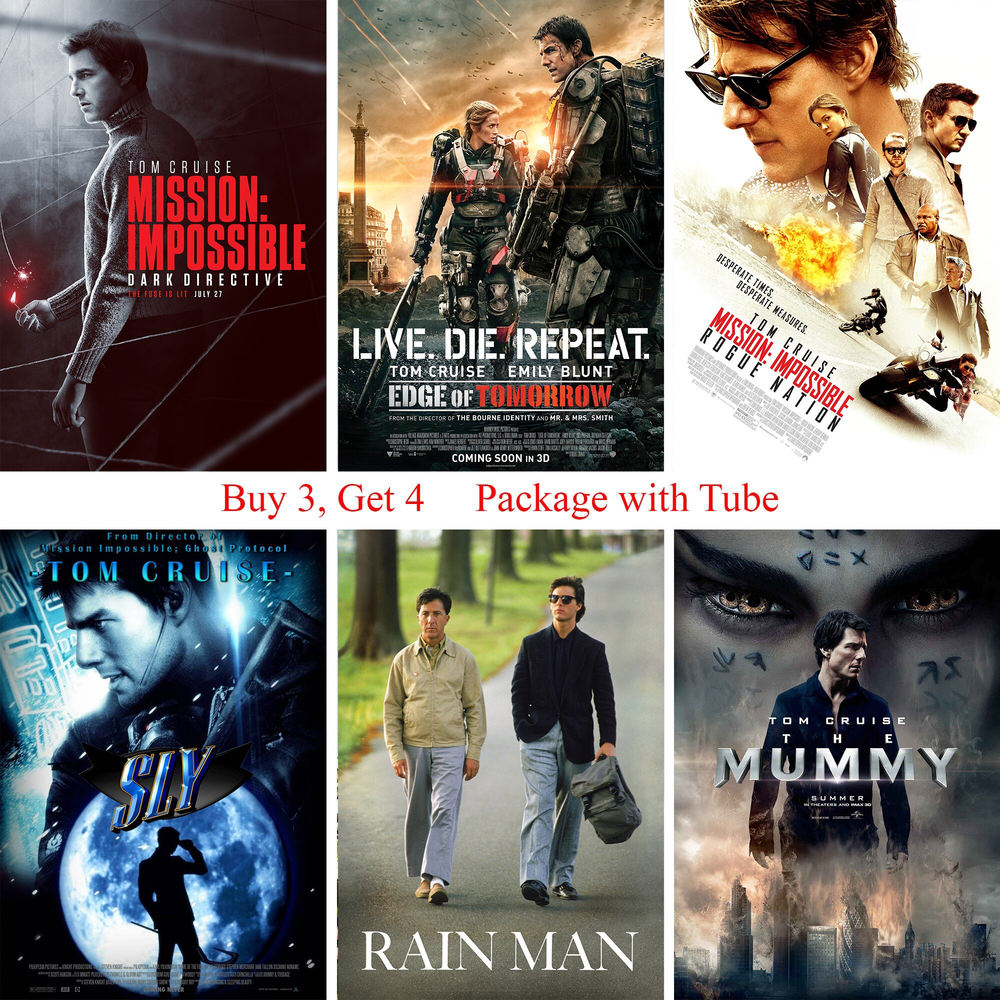

In [265]:
from IPython.display import Image
Image(filename='movies.png',width=1400, height=600)

# Preparation of Data

Data has been extracted fromt the following link 
https://www.imdb.com/search/title/?release_date=2019-01-01,2019-12-31&sort=num_votes,desc&start=51&ref_=adv_nxt

Scraping data for over 3000 movies

Gogin through the above link we can find that there are 50 links per page in particular area. Using  Python script using the BeautifulSoup library, which allows parsing HTML code, I limited the parsing to 4 pages for each year, so starting with the year 2000, my Python script retrieves the data on 4pages, then redo the same step on the following year until the year 2019.

Movie title 

Genre of the film 

Duration of the film (in minutes) 

Release year of the film 

Number of public votes 

Public rating (score out of 10)

Critics rating (score out of 100) 

Movie Gross (millions of dollars)

Feel free to visit link below on how i extracted data from IMDB website.

https://github.com/saphal/IMDB-DATA-SET/blob/master/IMDB_MOVIE_DATA_SET.ipynb

Let's load the data 

In [13]:
# Importing the important libraries that we shall use in this investigation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib
sns.set(style="ticks", color_codes=True)
import warnings
warnings.filterwarnings('ignore')
print("success...")


success...


In [14]:
movies_data = pd.read_csv('movie_ratings.csv')

In [15]:
len(movies_data)

9600

In [16]:
movies_data.head()


,Unnamed: 0,movie,year,imdb,metascore,votes,genre,runtime,gross
0,0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
1,1,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
2,2,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
3,3,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
4,4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0


## Lets copy our dataset so that we have orginal data. 



In [96]:
df = movies_data.copy(deep=True)

In [97]:
df.head()

,Unnamed: 0,movie,year,imdb,metascore,votes,genre,runtime,gross
0,0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
1,1,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
2,2,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
3,3,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
4,4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0


#### Lets Clear Unwanted column


In [98]:
del df['Unnamed: 0']

In [99]:
df.head()

,movie,year,imdb,metascore,votes,genre,runtime,gross
0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
1,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
2,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
3,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0


#### Lets clear the duplicate data set.

In [100]:
df.drop_duplicates(keep = 'first', inplace=True)

In [101]:
df.info()
df.head()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2440 entries, 0 to 9583
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   movie      2440 non-null   object 
 1   year       2440 non-null   int64  
 2   imdb       2440 non-null   float64
 3   metascore  2440 non-null   int64  
 4   votes      2440 non-null   int64  
 5   genre      2440 non-null   object 
 6   runtime    2440 non-null   int64  
 7   gross      2163 non-null   float64
dtypes: float64(2), int64(4), object(2)
memory usage: 171.6+ KB


,movie,year,imdb,metascore,votes,genre,runtime,gross
0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0
5,The Jazz Singer,1927,6.5,66,8473,"['Drama', ' Music', ' Musical']",88,7630000.0
12,The Circus,1928,8.2,90,24153,"['Comedy', ' Romance']",72,NaN
16,Piccadilly,1929,7.2,89,1262,"['Drama', ' Crime']",92,NaN


In [23]:
len(df)


2440

## Lets clear the gross with NaN value

In [102]:
df = df.dropna(subset=['gross'], axis=0)



In [25]:
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2163 entries, 0 to 9583
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   movie      2163 non-null   object 
 1   year       2163 non-null   int64  
 2   imdb       2163 non-null   float64
 3   metascore  2163 non-null   int64  
 4   votes      2163 non-null   int64  
 5   genre      2163 non-null   object 
 6   runtime    2163 non-null   int64  
 7   gross      2163 non-null   float64
dtypes: float64(2), int64(4), object(2)
memory usage: 152.1+ KB


,movie,year,imdb,metascore,votes,genre,runtime,gross
0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,"['Drama', ' History']",163,2180000.0
4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0
5,The Jazz Singer,1927,6.5,66,8473,"['Drama', ' Music', ' Musical']",88,7630000.0
20,All Quiet on the Western Front,1930,8.0,91,54915,"['Drama', ' War']",136,3270000.0
21,Der blaue Engel,1930,7.7,88,12905,"['Drama', ' Music']",104,77982.0


In [26]:
df.tail()

,movie,year,imdb,metascore,votes,genre,runtime,gross
9512,Midsommar,2019,7.2,72,116770,"['Drama', ' Horror', ' Mystery']",147,27331977.0
9525,Avengers: Endgame,2019,8.5,78,668127,"['Action', ' Adventure', ' Drama']",181,858373000.0
9559,Men in Black: International,2019,5.6,38,85773,"['Action', ' Adventure', ' Comedy']",114,79800736.0
9581,Toy Story 4,2019,7.9,84,156311,"['Animation', ' Adventure', ' Comedy']",100,433033071.0
9583,Ad Astra,2019,6.6,80,143395,"['Adventure', ' Drama', ' Mystery']",123,35397514.0



# Now we are ready to do data analysis


## Lets find the highest rating movie in IMDB given by user

we will find the hihghest imdb rated given to the movie and then the name of the movie and gross collection

In [103]:
max(df.imdb)

9.3

In [104]:
df[(df['imdb'] == 9.3 )]

,movie,year,imdb,metascore,votes,genre,runtime,gross
4920,The Shawshank Redemption,1994,9.3,80,2191268,['Drama'],142,28341469.0


In [105]:
ar = df[(df['imdb'] >=8 )]

In [106]:
ar.head()

,movie,year,imdb,metascore,votes,genre,runtime,gross
4,Metropolis,1927,8.3,98,150600,"['Drama', ' Sci-Fi']",153,1236166.0
20,All Quiet on the Western Front,1930,8.0,91,54915,"['Drama', ' War']",136,3270000.0
28,City Lights,1931,8.5,99,155395,"['Comedy', ' Drama', ' Romance']",87,19181.0
60,It Happened One Night,1934,8.1,87,87946,"['Comedy', ' Romance']",105,4360000.0
68,Modern Times,1936,8.5,96,201692,"['Comedy', ' Drama', ' Family']",87,163245.0


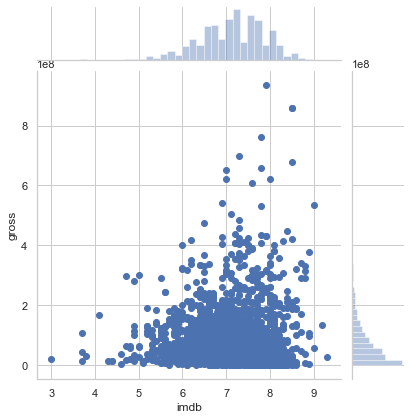

In [107]:
j12 = sns.jointplot(data=df, x='imdb', y='gross')

we can say that high gross movie has high rating by user.

## Lets find the highest rating given by critcs (Metascore)

In [108]:
max(df.metascore)

100

In [109]:
critics= df[(df['metascore'] ==100 )]
critics.head(20)

,movie,year,imdb,metascore,votes,genre,runtime,gross
96,The Wizard of Oz,1939,8.0,100,360264,"['Adventure', ' Family', ' Fantasy']",102,2076020.0
148,Citizen Kane,1941,8.3,100,376656,"['Drama', ' Mystery']",119,1585634.0
168,Casablanca,1942,8.5,100,493982,"['Drama', ' Romance', ' War']",102,1024560.0
209,Notorious,1946,7.9,100,87589,"['Drama', ' Film-Noir', ' Romance']",102,10464000.0
396,Rear Window,1954,8.4,100,416451,"['Mystery', ' Thriller']",112,36764313.0
540,Vertigo,1958,8.3,100,336595,"['Mystery', ' Romance', ' Thriller']",128,3200000.0
753,Lawrence of Arabia,1962,8.3,100,252529,"['Adventure', ' Biography', ' Drama']",228,44824144.0
1022,Au hasard Balthazar,1966,7.9,100,16133,['Drama'],95,39388.0
1532,The Godfather,1972,9.2,100,1509749,"['Crime', ' Drama']",175,134966411.0
2864,Fanny och Alexander,1982,8.1,100,53837,['Drama'],188,4971340.0


This are the highest movie rated by critics

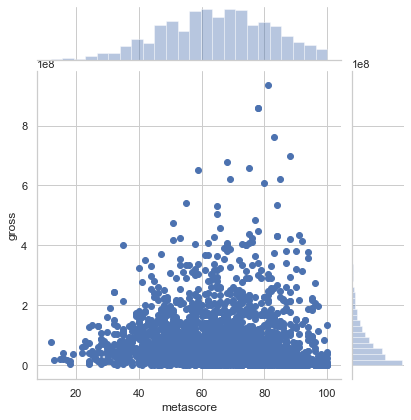

In [246]:
j1 = sns.jointplot(data=df, x='metascore', y='gross')

we can say that critics are very active from 1980 and present.

### Lets explore the data and see if there is any connection between audience rating and critical rating

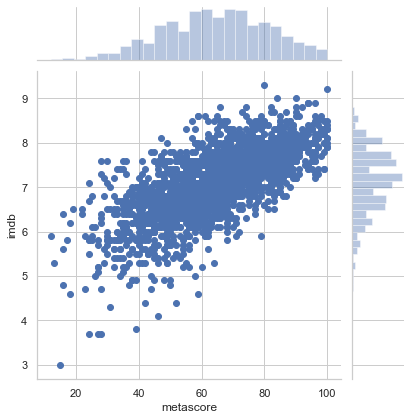

In [111]:
j1 = sns.jointplot(data=df, x='metascore', y='imdb')

From the above graph we can say that most of the time audience rating is alligned with critics rating. However
in some case we can see that it's not always true there is high critics rating for the movie where audience has given rating lower rating.

### Lets explore the data and see if there is any connection between audience rating and runtime

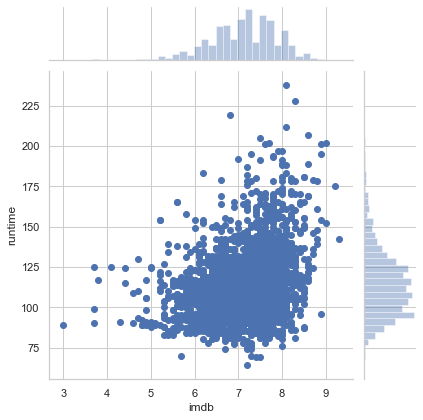

In [112]:
j2 = sns.jointplot(data=df, x='imdb', y='runtime')

We can say that audience there is some linear relationship between run time and audience rating.


### Lets explore the data and see if there is any connection between critics rating and runtime

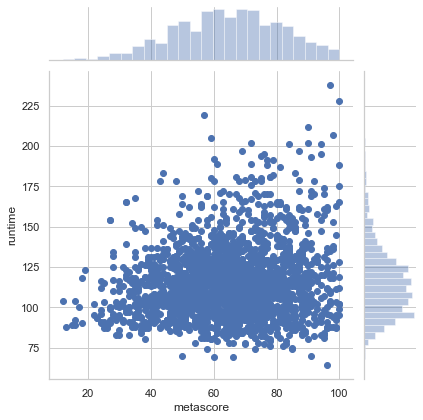

In [113]:
j3 = sns.jointplot(data=df, x='metascore', y='runtime')

we can align with critics rating and audince rating regarding run time. 

#### Do Movies that are well rated by public and critics make the most money ?

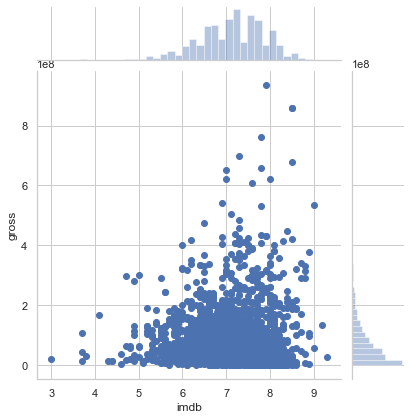

In [114]:
j4 = sns.jointplot(data=df, x='imdb', y='gross')

We can say that the movie with high gross collection lies between rating 6 to 8.5

Also we can conclude that highest audience rating does not necessary means high gross collection

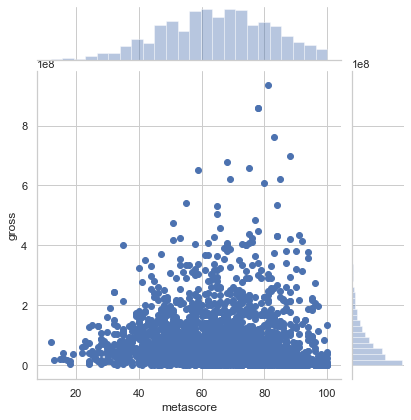

In [115]:
j4 = sns.jointplot(data=df, x='metascore', y='gross')

We can say that the movie with high gross collection lies between rating critics rating 60 to 85 (out of 100)

Also we can conclude that highest critics rating does not necessary means high gross collection.

## Film Rating vs Run time ?

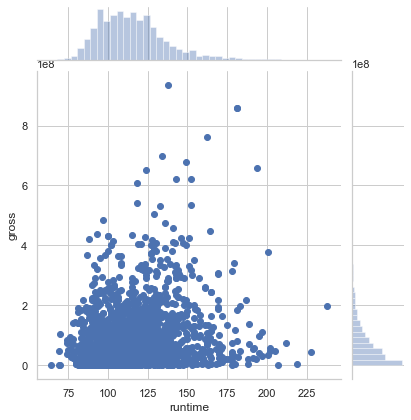

In [116]:
j5 = sns.jointplot(data=df, x='runtime', y='gross')

This data shows that movie run time above 125 min has better gross collection

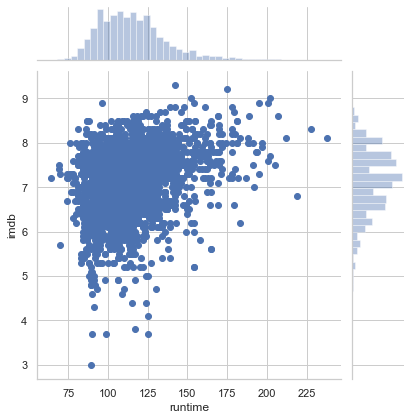

In [117]:
j5 = sns.jointplot(data=df, x='runtime', y='imdb')

Movie run time from 100 to 175 is more popular and has gross rating where as the more run time the more imdb rating.

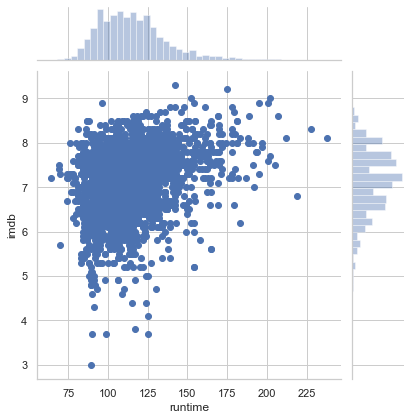

In [254]:
j6 = sns.jointplot(data=df, x='runtime', y='metascore')

Movie run time from 100 to 175 is more popular and has gross rating where as the more run time the more critics rating.

### VOTES

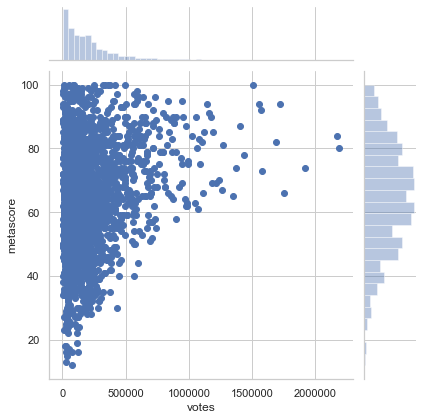

In [251]:
j6 = sns.jointplot(data=df, x='votes', y='metascore')

It seems less no of votes for highest critics rating movie

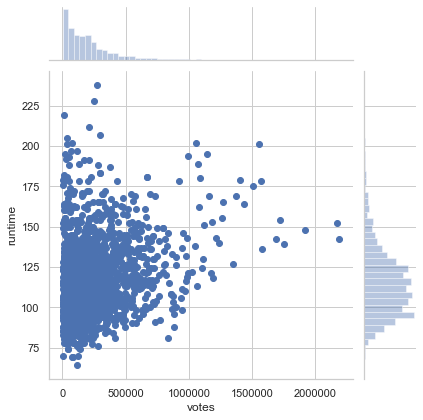

In [258]:
j7 = sns.jointplot(data=df, x='votes', y='runtime')

movie with run time of 125 min to 200 min has more votes

In [179]:
df.head()

,movie,year,imdb,metascore,votes,runtime,gross,genre
0,Intolerance: Love's Struggle Throughout the Ages,1916,7.8,99,13306,163,2180000.0,"['Drama', ' History']"
4,Metropolis,1927,8.3,98,150600,153,1236166.0,"['Drama', ' Sci-Fi']"
5,The Jazz Singer,1927,6.5,66,8473,88,7630000.0,"['Drama', ' Music', ' Musical']"
20,All Quiet on the Western Front,1930,8.0,91,54915,136,3270000.0,"['Drama', ' War']"
21,Der blaue Engel,1930,7.7,88,12905,104,77982.0,"['Drama', ' Music']"


In [218]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error



In [220]:
X_2 = df[['runtime', 'metascore', 'runtime', 'votes']]
y_2 = df['gross']

# Split data into training and test data, and fit a linear model
X_2_train, X_2_test, y_2_train, y_2_test = train_test_split(X_2, y_2 , test_size=.30, random_state=42)
lm = LinearRegression(normalize=True)

# If our model works, it should just fit our model to the data. Otherwise, it will let us know.
try:
    lm.fit(X_2_train, y_2_train)
except:
    print("Oh no! It doesn't work!!!")

In [221]:
y_test_preds = lm.predict(X_2_test)# Predictions here
r2_test = r2_score(y_2_test, y_test_preds) # Rsquared here

# Print r2 to see result
r2_test

0.29510355809850486

In [237]:
lm.fit(X_2_train, y_2_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)

In [238]:
print(lm.intercept_)

51605851.70941274


In [239]:

lm.coef_
#examining the co-efficients of the fitted model.

array([ 1.34648134e+05, -7.15203297e+05,  1.34648134e+05,  2.08720473e+02])

In [240]:
X_2_train.columns

Index(['runtime', 'metascore', 'runtime', 'votes'], dtype='object')

In [241]:
X_2_test.columns

Index(['runtime', 'metascore', 'runtime', 'votes'], dtype='object')

In [242]:
predictions = lm.predict(X_2_test)

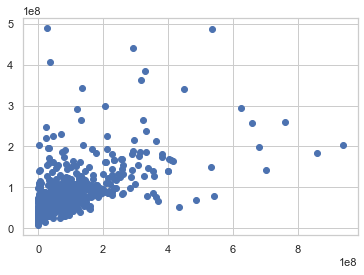

In [243]:

plt.scatter(y_2_test,predictions)

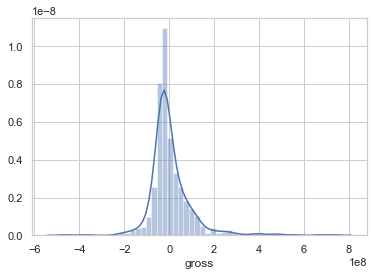

In [244]:
sns.distplot((y_2_test-predictions))

## Result / Conclusion

In this notebook, we took a look at what were the most popular movies rated by user and critics and thier gross collection.

Below is the summary of this finding.

1.The Shawshank Redemption is the all time rated movie by user with the score of 9.3 out of 10.

2.high gross movie has high rating by user and critics

3.We found top 12 movie that had highest critics score 100 out of 1oo but that does not mean they had highest gross collection

4.User and critics rating are align movie with run time from 100min-175min were more popular among them.

4.We found that less number of votes is there for highest rated critics movie

6.Movie with run time of 125 min to 200 min has more votes
